In [62]:
import numpy as np
import matplotlib.pyplot as plt
import scipy

from pathlib import Path

In [143]:
savepath = Path('test_samples', 'noise_samples')
savepath.mkdir(parents=True, exist_ok=True)

In [145]:
import math
def colored_noise(nsamples, sr, alpha=1):
    wnoise = np.random.uniform(0.5, 1.5, size=nsamples//2 + 1)
    wnoise_img = np.random.uniform(0.5, 1.5, size=nsamples//2 + 1)
#     sxx_w = rfft(wnoise)
    sxx_w = wnoise + 1j*wnoise_img
    freqs = rfftfreq(nsamples, d=1/sr)
    
    sxx_p = sxx_w.copy()
    sxx_p[1:] = 10**(80/20)*sxx_w[1:]/np.sqrt(freqs[1:]**alpha)
    
    pnoise = irfft(sxx_p)
    return pnoise
    

(661501,)
(661501,)


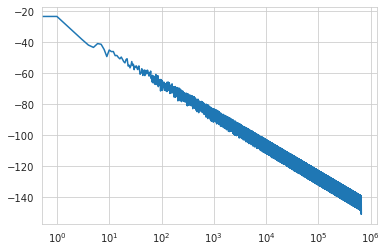

In [210]:
from scipy.fft import rfft, irfft, rfftfreq
from scipy.signal import windows
import librosa.util as util

import soundfile

seconds=30
sr=44100
nfft=8192
# att=10*
noise = colored_noise(seconds*sr, sr, alpha=2)

noise = util.normalize(noise, norm=np.inf, axis=None)
# noise = (noise - noise.min())/(noise.max() - noise.min())

sxx = rfft(noise)/(noise.shape[0])
sxx = np.abs(sxx)

sxx = 20*np.log10(sxx)
fig, ax = plt.subplots()
ax.plot(sxx)
ax.set_xscale('log')
soundfile.write(savepath / 'brown_noise.wav', noise, samplerate=sr, subtype='PCM_24')

In [211]:
from IPython.display import Audio
Audio(savepath / 'brown_noise.wav')

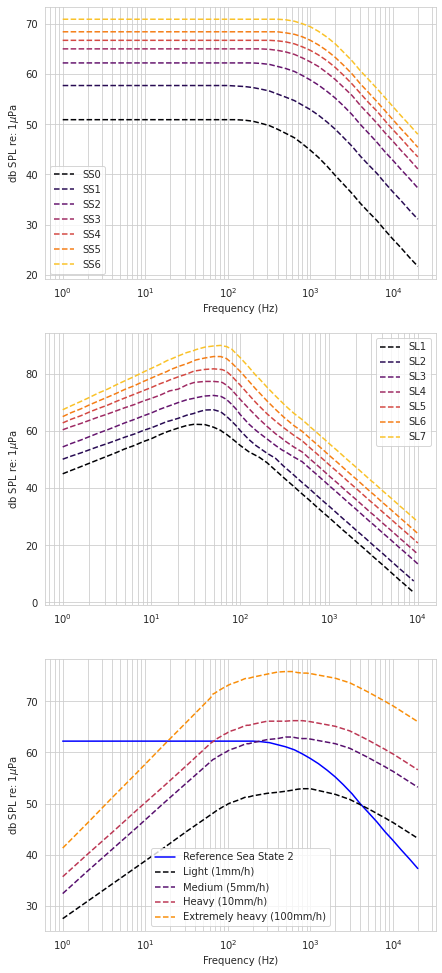

In [321]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib.ticker import ScalarFormatter

sns.set_style('whitegrid')
sea_state = pd.read_csv('sea_state.txt', delimiter=' ')
shipping_noise = pd.read_csv('shipping_noise.txt', delimiter=' ')
rain_noise = pd.read_csv('rain_noise.txt', delimiter=';')

sea_state.set_index('Frequency', inplace=True)
shipping_noise.set_index('Frequency', inplace=True)
rain_noise.set_index('Frequency', inplace=True)

freq_cut = 20000
sea_state = sea_state[sea_state.index <= freq_cut]

n = len(sea_state.columns)
cycler = iter([plt.get_cmap('inferno')(1. * i/n) for i in range(n)])



fig, axes = plt.subplots(nrows=3, figsize=(7,3*5 + 2))
for state in sea_state.columns:
    x = sea_state.index.values
    y = sea_state[state].values
    
    axes[0].plot(x, y, label=state, linestyle='--', color=next(cycler))
    axes[0].set_xscale('log')
    axes[0].set_xlabel('Frequency (Hz)')
    axes[0].set_ylabel('db SPL re: 1$\mu$Pa')
    
n = len(shipping_noise.columns)
cycler = iter([plt.get_cmap('inferno')(1. * i/n) for i in range(n)])
    
shipping_noise = shipping_noise[shipping_noise.index <= freq_cut]
for state in shipping_noise.columns:
    x = shipping_noise.index.values
    y = shipping_noise[state].values
    
    axes[1].plot(x, y, label=state, linestyle='--', color=next(cycler))
    axes[1].set_xscale('log')
    axes[1].set_ylabel('db SPL re: 1$\mu$Pa')
    
        
n = len(rain_noise.columns)
cycler = iter([plt.get_cmap('inferno')(1. * i/n) for i in range(n)])
    
x = sea_state.index.values
y = sea_state['SS2'].values
axes[2].plot(x, y, label=f"Reference Sea State 2", linestyle='-', color='b')

rain_noise = rain_noise[rain_noise.index <= freq_cut]
for state in rain_noise.columns:
    x = rain_noise.index.values
    y = rain_noise[state].values
    
    axes[2].plot(x, y, label=state, linestyle='--', color=next(cycler))
    axes[2].set_xscale('log')
    axes[2].set_xlabel('Frequency (Hz)')
    axes[2].set_ylabel('db SPL re: 1$\mu$Pa')

    
axes[0].legend()
axes[1].legend()
axes[2].legend()

axes[0].grid(True, which="both")
axes[1].grid(True, which="both")
axes[2].grid(True, which="both")


In [322]:
from scipy.interpolate import interp1d
import librosa.util as util
import librosa
from scipy.signal.windows import hann
import numpy as np

sea_state = pd.read_csv('sea_state.txt', delimiter=' ')
shipping_noise = pd.read_csv('shipping_noise.txt', delimiter=' ')
rain_noise = pd.read_csv('rain_noise.txt', delimiter=';')

sea_state.set_index('Frequency', inplace=True)
shipping_noise.set_index('Frequency', inplace=True)
rain_noise.set_index('Frequency', inplace=True)


def sim_noise(nsamples, sr, freqs, noise_curve):
    wnoise = np.random.normal(0.0, 1., size=nsamples)
    sxx_w = rfft(wnoise)
    freqs = rfftfreq(nsamples, d=1/sr)
    

    sxx_p = sxx_w.copy()
    sxx_w = (sxx_w - sxx_w.mean())/sxx_w.std()
    sxx_p = sxx_w*(10**(noise_curve(freqs)/20))
    pnoise = irfft(sxx_p)
    print(noise_curve(freqs))
    return pnoise, sxx_p, noise_curve(freqs[0:]), freqs

def sea_noise(nsamples, sr, state=1):
    y = sea_state[f"SS{state}"].values
    x = sea_state.index.values
    noise_curve = interp1d(x, y, bounds_error=False, fill_value='extrapolate')
    return sim_noise(nsamples, sr, freqs, noise_curve)

def ship_noise(nsamples, sr, state=1):
    y = shipping_noise[f"SL{state}"].values
    x = shipping_noise.index.values
    noise_curve = interp1d(x, y, bounds_error=False, fill_value='extrapolate')
    return sim_noise(nsamples, sr, freqs, noise_curve)

[62.2      62.2      62.2      ... 42.062048 42.062024 42.062   ]


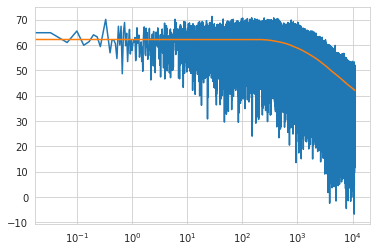

In [296]:
seconds=30
sr=22050
nfft=8192
sea = 2
noise, sxx_p, sea_state_curve, freqs = sea_noise(seconds*sr, sr, state=sea)
fig, ax = plt.subplots()
# ax.plot(sxx_w)
ax.plot(freqs, 20*np.log10(np.abs(sxx_p)))
ax.plot(freqs, sea_state_curve)
ax.set_xscale('log')

sxx = rfft(noise)/(noise.shape[0])
sxx = np.abs(sxx)

soundfile.write(savepath / f'sea_state_{sea}.wav', noise, samplerate=sr, subtype='PCM_24')

In [288]:
from IPython.display import Audio
Audio(savepath / 'sea_state_2.wav')

[59.4        59.58666667 59.77333333 ... 25.40009333 25.40004667
 25.4       ]


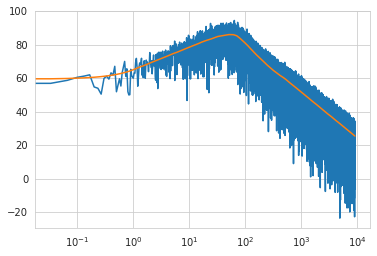

In [305]:
seconds=30
sr=18000
nfft=8192
state = 6
noise, sxx_p, sea_state_curve, freqs = ship_noise(seconds*sr, sr, state=state)
fig, ax = plt.subplots()
# ax.plot(sxx_w)
ax.plot(freqs, 20*np.log10(np.abs(sxx_p)))
ax.plot(freqs, sea_state_curve)
ax.set_xscale('log')

sxx = rfft(noise)/(noise.shape[0])
sxx = np.abs(sxx)

soundfile.write(savepath / f'ship_state_{state}.wav', noise, samplerate=sr, subtype='PCM_24')

In [298]:
from IPython.display import Audio
Audio(savepath / 'ship_state_1.wav')